In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#Import libraries and read in one file to test

import pandas as pd
file = pd.read_excel("20400.xlsx")


In [0]:

import numpy 
import cython

%matplotlib inline

from fbprophet import Prophet

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [0]:
#read in all the files in the uploaded files
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir('.') if isfile(join('.', f))]
onlyfiles

In [0]:
#Create a dictionary and load each one of the files into this dictionary
#This creates a dictionary of dataframes

df_dict = {}

check = None
for filename in onlyfiles: #begin iterating through all the excel spreadsheets in the uploaded files
  file = pd.read_excel(filename) #read in each .xlsx
  address = file.iloc[0,0] #pull out the address for each location for future use as dictionary key
  file = file.rename(columns={file.columns[0]: 'Month'}) #rename columns starting with Month
  file = file.rename(columns={file.columns[4]: 'Cost/Usage', file.columns[6]: 'Occupancy', file.columns[10]: 'Demand', file.columns[11]: 'Billed Usage'}) #rename remaining columns
  file = file[['Month', 'Cost/Usage', 'Occupancy','Demand', 'Billed Usage']] #name the columns in the dataframe
  file = file.dropna() #get rid of rows with empty data
  file = file[1:-1] #get rid of the last row, which sums up all the other rows
  #file = file.set_index(['Month']) #set index to month

#this code just does a quick sanity check
  if filename == '20400.xlsx':
    check = file

#This code shows each one of the dataframes in the dictionary
  df_dict[address] = file
  print("Added", file.shape[0], "rows from", filename, address)

print(df_dict.keys())

In [0]:
check

In [0]:
df_dict

In [0]:
ax = None
for key in df_dict.keys():
  if len(df_dict[key]) > 0:
    if ax == None:
      ax = df_dict[key]['Cost/Usage'].plot()
    else:
      df_dict[key]['Cost/Usage'].plot(ax=ax)
ax.legend()

In [0]:
df_dict['Property: 48250-16539 Commerce Drive (Dahlgren)'].head()

In [0]:
df_dict.keys()

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

MessageError: ignored

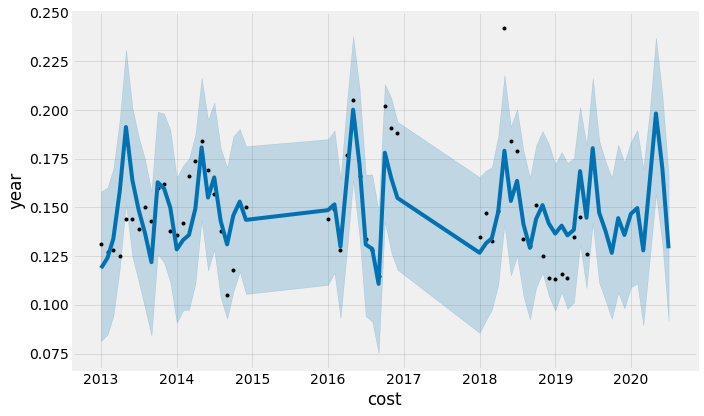

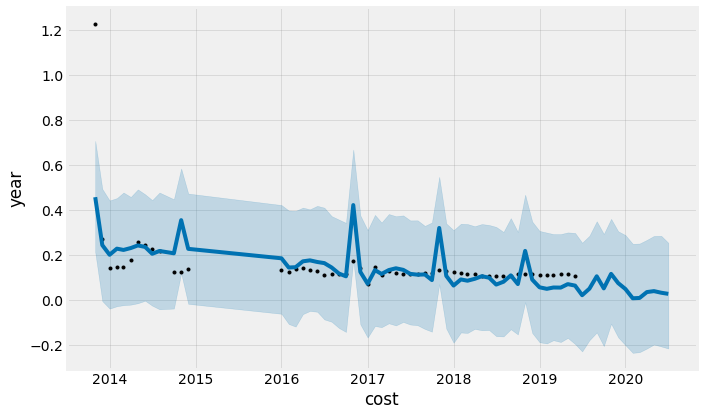

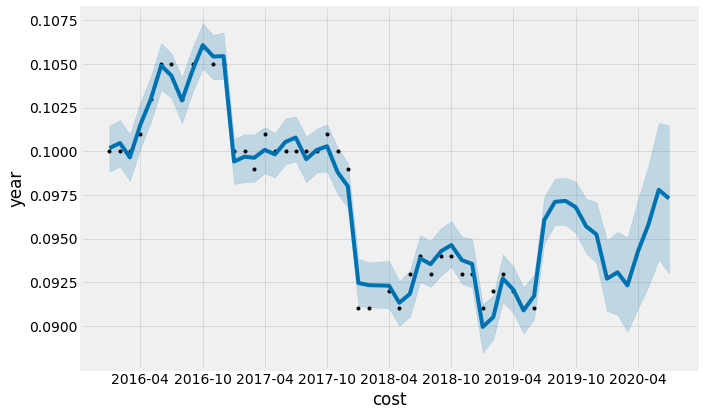

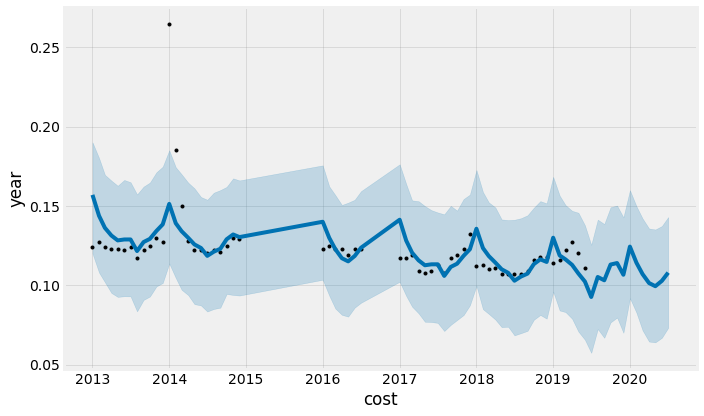

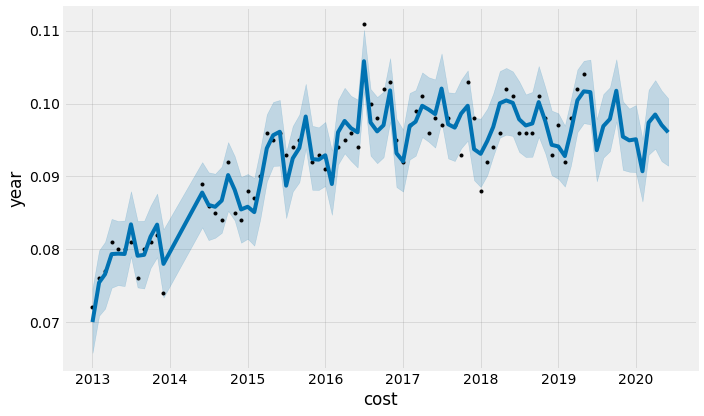

...

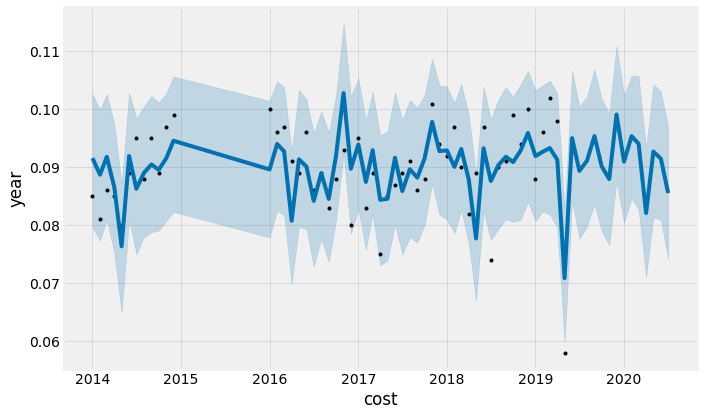

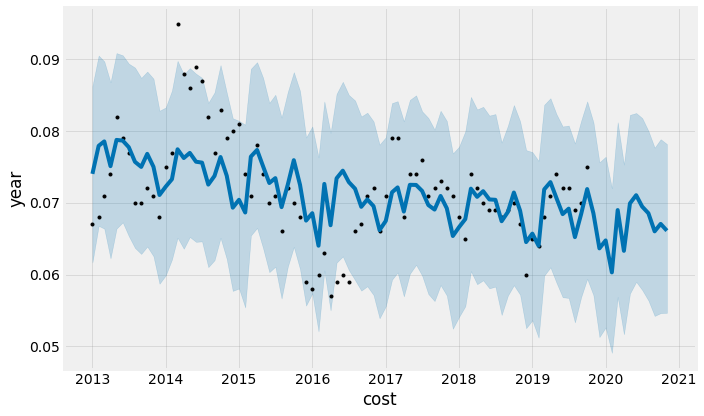

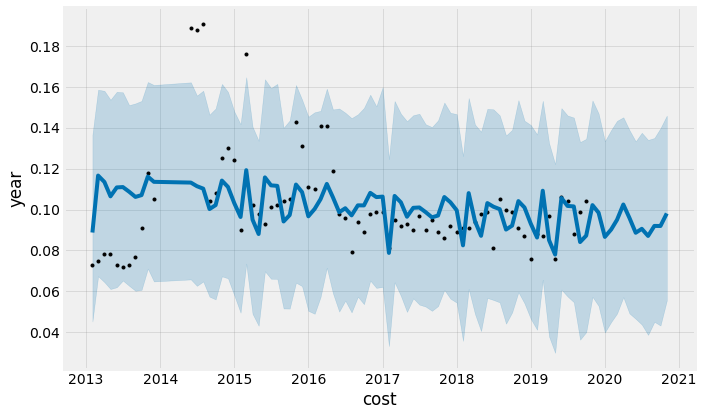

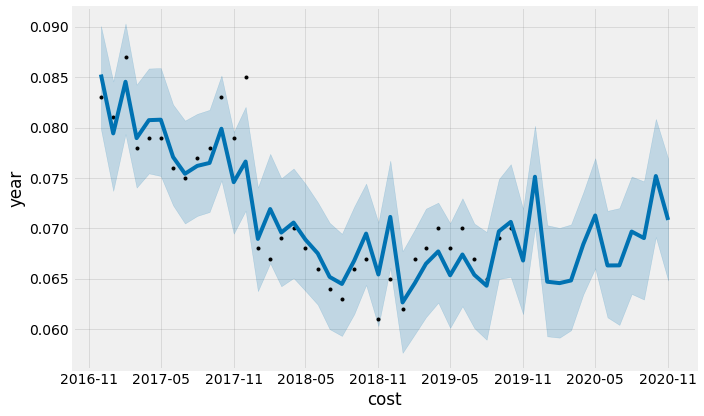

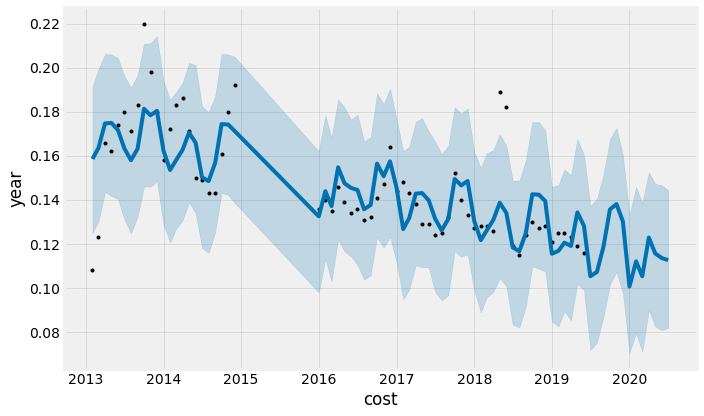

In [38]:
df_cost = pd.DataFrame()
for address in df_dict.keys():
    Costdf = df_dict[address] 
    Costdf['Month'] = pd.to_datetime(Costdf['Month']) 
    Costdf = Costdf[['Month', 'Cost/Usage']]
    Costdf = Costdf.rename(columns={'Month': 'ds' ,'Cost/Usage': 'y'})
     
    Cost_model = Prophet(interval_width=0.95)
    
    if Costdf.shape[0] < 2:
      continue
    Cost_model.fit(Costdf)
    future_dates = Cost_model.make_future_dataframe(periods=13, freq='MS')
    future_dates.tail()
    forecast = Cost_model.predict(future_dates)
    forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
    costax = Cost_model.plot(forecast, uncertainty=True, ylabel = 'year', xlabel='cost')
    forecast["Address"] = address 
    df_cost = df_cost.append(forecast)
    df_cost.to_csv('costoutput.csv', index=False)

    
    

In [0]:
from google.colab import files
files.download("costoutput.csv")

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
62  Property: 44820 - 206 Research Blvd      -56.779673  ... -258.411293  420.881437
63  Property: 44820 - 206 Research Blvd      -23.872233  ... -243.424099  419.929656
64  Property: 44820 - 206 Research Blvd      -24.916764  ... -257.678239  426.780910
65  Property: 44820 - 206 Research Blvd       34.300743  ... -185.661692  487.338976
66  Property: 44820 - 206 Research 

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                        Address  ...  yhat_upper
0          Property: 44820 - 206 Research Blvd  ...    0.159485
1          Property: 44820 - 206 Research Blvd  ...    0.163045
2          Property: 44820 - 206 Research Blvd  ...    0.172723
3          Property: 44820 - 206 Research Blvd  ...    0.196452
4          Property: 44820 - 206 Research Blvd  ...    0.228068
..                                         ...  ...         ...
63  Property: 21250 - 1201 Winterson Road-AS13  ...  576.334443
64  Property: 21250 - 1201 Winterson Road-AS13  ...  694.835239
65  Property: 21250 - 1201 Winterson Road-AS13  ...  501.615387
66  Property: 21250 - 1201 Winterson Road-AS13  ...  524.213540
67  Property: 21250 - 1201 Winterson Road-AS13  ...  520.783707

[8695 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                   Address  ...   yhat_upper
0     Property: 44820 - 206 Research Blvd  ...     0.159485
1     Property: 44820 - 206 Research Blvd  ...     0.163045
2     Property: 44820 - 206 Research Blvd  ...     0.172723
3     Property: 44820 - 206 Research Blvd  ...     0.196452
4     Property: 44820 - 206 Research Blvd  ...     0.228068
..                                    ...  ...          ...
49  Property: 41910 - Canton Crossing UDC  ...  2373.566923
50  Property: 41910 - Canton Crossing UDC  ...  2597.328598
51  Property: 41910 - Canton Crossing UDC  ...  2893.346194
52  Property: 41910 - Canton Crossing UDC  ...  2810.903489
53  Property: 41910 - Canton Crossing UDC  ...  2929.623458

[8681 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
69   Property: 25000 - 1362 Mellon Road       90.319380  ...  340.288133  432.319583
70   Property: 25000 - 1362 Mellon Road       -1.508093  ...  244.401115  343.052182
71   Property: 25000 - 1362 Mellon Road     -113.707552  ...  131.550775  229.635781
72   Property: 25000 - 1362 Mellon Road      -81.150265  ...  165.066604  261.882543
73   Property: 25000 - 1362 Mellon 

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
80             Property: 35 West Wacker  ...  2059.336639
81             Property: 35 West Wacker  ...  2092.131258
82             Property: 35 West Wacker  ...  1839.017151
83             Property: 35 West Wacker  ...  1520.622094
84             Property: 35 West Wacker  ...  1390.946465

[8712 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
74  Property: 50500 - 13454 Sunrise Valley Road  ...  525.360904
75  Property: 50500 - 13454 Sunrise Valley Road  ...  486.921608
76  Property: 50500 - 13454 Sunrise Valley Road  ...  428.767313
77  Property: 50500 - 13454 Sunrise Valley Road  ...  505.743574
78  Property: 50500 - 13454 Sunrise Valley Road  ...  517.743870

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
50    Property: 41970 - 30 Light Street       43.808427  ...   77.898336  118.193867
51    Property: 41970 - 30 Light Street        2.614582  ...   36.430544   76.539780
52    Property: 41970 - 30 Light Street      -19.015393  ...   15.491353   53.421920
53    Property: 41970 - 30 Light Street      -25.899522  ...    7.496732   48.710656
54    Property: 41970 - 30 Light St

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                            Address  ...  yhat_upper
0              Property: 44820 - 206 Research Blvd  ...    0.159485
1              Property: 44820 - 206 Research Blvd  ...    0.163045
2              Property: 44820 - 206 Research Blvd  ...    0.172723
3              Property: 44820 - 206 Research Blvd  ...    0.196452
4              Property: 44820 - 206 Research Blvd  ...    0.228068
..                                             ...  ...         ...
74  Property: 27400 - 2721 Technology Drive-NBP221  ...  339.526502
75  Property: 27400 - 2721 Technology Drive-NBP221  ...  263.256488
76  Property: 27400 - 2721 Technology Drive-NBP221  ...  365.598687
77  Property: 27400 - 2721 Technology Drive-NBP221  ...  280.278411
78  Property: 27400 - 2721 Technology Drive-NBP221  ...  301.461346

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
89   Property: 400 Bridgewater Crossing  ...  1395.840069
90   Property: 400 Bridgewater Crossing  ...  1531.874736
91   Property: 400 Bridgewater Crossing  ...  1419.448803
92   Property: 400 Bridgewater Crossing  ...  1400.773740
93   Property: 400 Bridgewater Crossing  ...  1433.227103

[8721 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                     Address  ...  yhat_upper
0       Property: 44820 - 206 Research Blvd  ...    0.159485
1       Property: 44820 - 206 Research Blvd  ...    0.163045
2       Property: 44820 - 206 Research Blvd  ...    0.172723
3       Property: 44820 - 206 Research Blvd  ...    0.196452
4       Property: 44820 - 206 Research Blvd  ...    0.228068
..                                      ...  ...         ...
74  Property: 48750-44408 Pecan Court (Pax)  ...  231.359052
75  Property: 48750-44408 Pecan Court (Pax)  ...  208.078658
76  Property: 48750-44408 Pecan Court (Pax)  ...  221.708133
77  Property: 48750-44408 Pecan Court (Pax)  ...  192.420111
78  Property: 48750-44408 Pecan Court (Pax)  ...  214.063650

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
70  Property: 26020 - 410 Natl Business Pkwy-NBP410  ...  202.578517
71  Property: 26020 - 410 Natl Business Pkwy-NBP410  ...  156.837785
72  Property: 26020 - 410 Natl Business Pkwy-NBP410  ...  170.023930
73  Property: 26020 - 410 Natl Business Pkwy-NBP410  ...  193.414560
74  Property: 26020 - 410 Natl Business Pkwy-NBP410  ...  287.233312

[8702 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...    yhat_upper
0   Property: 44820 - 206 Research Blvd  ...      0.159485
1   Property: 44820 - 206 Research Blvd  ...      0.163045
2   Property: 44820 - 206 Research Blvd  ...      0.172723
3   Property: 44820 - 206 Research Blvd  ...      0.196452
4   Property: 44820 - 206 Research Blvd  ...      0.228068
..                                  ...  ...           ...
81    Property: 6565 N. MacArthur Blvd.  ...  56288.553292
82    Property: 6565 N. MacArthur Blvd.  ...  61047.409669
83    Property: 6565 N. MacArthur Blvd.  ...  28945.807636
84    Property: 6565 N. MacArthur Blvd.  ...  60214.082538
85    Property: 6565 N. MacArthur Blvd.  ...  58118.891093

[8713 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
62           Property: 400 TownPark LLC  ...   987.711955
63           Property: 400 TownPark LLC  ...  1012.995470
64           Property: 400 TownPark LLC  ...  1002.768030
65           Property: 400 TownPark LLC  ...   972.472928
66           Property: 400 TownPark LLC  ...   905.612150

[8694 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                               Address  ...  yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...    0.159485
1                 Property: 44820 - 206 Research Blvd  ...    0.163045
2                 Property: 44820 - 206 Research Blvd  ...    0.172723
3                 Property: 44820 - 206 Research Blvd  ...    0.196452
4                 Property: 44820 - 206 Research Blvd  ...    0.228068
..                                                ...  ...         ...
74  Property: 50100-14900 Conference Center Drive ...  ...  612.504939
75  Property: 50100-14900 Conference Center Drive ...  ...  564.652770
76  Property: 50100-14900 Conference Center Drive ...  ...  524.801492
77  Property: 50100-14900 Conference Center Drive ...  ...  598.817699
78  Property: 50100-14900 Conference Center Drive ...  ...  614.256586

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
44               Property: Galleria 200      -11.467851  ...  157.016910  816.278568
45               Property: Galleria 200       49.044070  ...  206.063680  840.453822
46               Property: Galleria 200       98.320812  ...  247.512398  885.216215
47               Property: Galleria 200      176.672425  ...  296.779732  929.558915
48               Property: Galleria

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                      Address  ...  yhat_upper
0        Property: 44820 - 206 Research Blvd  ...    0.159485
1        Property: 44820 - 206 Research Blvd  ...    0.163045
2        Property: 44820 - 206 Research Blvd  ...    0.172723
3        Property: 44820 - 206 Research Blvd  ...    0.196452
4        Property: 44820 - 206 Research Blvd  ...    0.228068
..                                       ...  ...         ...
74  Property: 44840 - 210 Research Boulevard  ...  588.821660
75  Property: 44840 - 210 Research Boulevard  ...  514.958207
76  Property: 44840 - 210 Research Boulevard  ...  412.354565
77  Property: 44840 - 210 Research Boulevard  ...  428.212347
78  Property: 44840 - 210 Research Boulevard  ...  451.611035

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 22.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
37                      Property: CNL I      -27.348293  ...  413.275873  460.218609
38                      Property: CNL I      -39.120647  ...  401.634444  449.673949
39                      Property: CNL I        4.723488  ...  443.276619  495.191189
40                      Property: CNL I      -86.900372  ...  352.814744  402.727763
41                      Property: C

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 26500 - 141 Natl Business Pkwy-NBP141  ...  250.422650
75  Property: 26500 - 141 Natl Business Pkwy-NBP141  ...  216.556157
76  Property: 26500 - 141 Natl Business Pkwy-NBP141  ...  125.490886
77  Property: 26500 - 141 Natl Business Pkwy-NBP141  ...  192.273123
78  Property: 26500 - 141 Natl Business Pkwy-NBP141  ...  204.699921

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
61              Property: 80 Central St  ...  1062.060584
62              Property: 80 Central St  ...  1171.375251
63              Property: 80 Central St  ...   954.772576
64              Property: 80 Central St  ...   983.232831
65              Property: 80 Central St  ...   809.854360

[8693 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
89               Property: 400 Virginia      -94.405860  ...  573.305273  901.745594
90               Property: 400 Virginia     -100.455283  ...  553.080947  916.200021
91               Property: 400 Virginia      -65.731068  ...  587.482272  935.456268
92               Property: 400 Virginia       -9.558000  ...  637.764626  998.711750
93               Property: 400 Virg

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/usr/local/lib/python3.6/dist-packages/fbprophet/plot.py:65: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
88      Property: 6031 Connection Drive  ...  1015.501213
89      Property: 6031 Connection Drive  ...   953.276661
90      Property: 6031 Connection Drive  ...   903.400128
91      Property: 6031 Connection Drive  ...   835.978302
92      Property: 6031 Connection Drive  ...   801.604043

[8720 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
83                  Property: 5 Wayside  ...   894.021872
84                  Property: 5 Wayside  ...   928.060749
85                  Property: 5 Wayside  ...   937.439544
86                  Property: 5 Wayside  ...  1045.632348
87                  Property: 5 Wayside  ...   903.276898

[8715 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                   Address  ...   yhat_upper
0     Property: 44820 - 206 Research Blvd  ...     0.159485
1     Property: 44820 - 206 Research Blvd  ...     0.163045
2     Property: 44820 - 206 Research Blvd  ...     0.172723
3     Property: 44820 - 206 Research Blvd  ...     0.196452
4     Property: 44820 - 206 Research Blvd  ...     0.228068
..                                    ...  ...          ...
74  Property: 50950 - 1753 Pinnacle Drive  ...  1157.193253
75  Property: 50950 - 1753 Pinnacle Drive  ...   939.332693
76  Property: 50950 - 1753 Pinnacle Drive  ...   752.404895
77  Property: 50950 - 1753 Pinnacle Drive  ...   774.376992
78  Property: 50950 - 1753 Pinnacle Drive  ...   868.463090

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...   yhat_upper
0           Property: 44820 - 206 Research Blvd  ...     0.159485
1           Property: 44820 - 206 Research Blvd  ...     0.163045
2           Property: 44820 - 206 Research Blvd  ...     0.172723
3           Property: 44820 - 206 Research Blvd  ...     0.196452
4           Property: 44820 - 206 Research Blvd  ...     0.228068
..                                          ...  ...          ...
74  Property: 26650 - 304 Sentinel Drive-NBP304  ...  1057.758022
75  Property: 26650 - 304 Sentinel Drive-NBP304  ...   811.037978
76  Property: 26650 - 304 Sentinel Drive-NBP304  ...   879.468610
77  Property: 26650 - 304 Sentinel Drive-NBP304  ...   880.991565
78  Property: 26650 - 304 Sentinel Drive-NBP304  ...   943.226456

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                           Address  ...  yhat_upper
0             Property: 44820 - 206 Research Blvd  ...    0.159485
1             Property: 44820 - 206 Research Blvd  ...    0.163045
2             Property: 44820 - 206 Research Blvd  ...    0.172723
3             Property: 44820 - 206 Research Blvd  ...    0.196452
4             Property: 44820 - 206 Research Blvd  ...    0.228068
..                                            ...  ...         ...
73  Property: 31200 - 7150 Columbia Gateway Drive  ...   17.885955
74  Property: 31200 - 7150 Columbia Gateway Drive  ...   16.436804
75  Property: 31200 - 7150 Columbia Gateway Drive  ...   21.769248
76  Property: 31200 - 7150 Columbia Gateway Drive  ...   25.726050
77  Property: 31200 - 7150 Columbia Gateway Drive  ...   28.059826

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
89            Property: 60 Broad Street  ...  2607.222198
90            Property: 60 Broad Street  ...  2616.714918
91            Property: 60 Broad Street  ...  2608.355390
92            Property: 60 Broad Street  ...  2549.449019
93            Property: 60 Broad Street  ...  2186.436824

[8721 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                  Address  ...  yhat_upper
0    Property: 44820 - 206 Research Blvd  ...    0.159485
1    Property: 44820 - 206 Research Blvd  ...    0.163045
2    Property: 44820 - 206 Research Blvd  ...    0.172723
3    Property: 44820 - 206 Research Blvd  ...    0.196452
4    Property: 44820 - 206 Research Blvd  ...    0.228068
..                                   ...  ...         ...
74  Property: 58500 - 7770 Backlick Road  ...  659.746970
75  Property: 58500 - 7770 Backlick Road  ...  616.564114
76  Property: 58500 - 7770 Backlick Road  ...  574.134338
77  Property: 58500 - 7770 Backlick Road  ...  556.944234
78  Property: 58500 - 7770 Backlick Road  ...  643.458418

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...   yhat_upper
0           Property: 44820 - 206 Research Blvd  ...     0.159485
1           Property: 44820 - 206 Research Blvd  ...     0.163045
2           Property: 44820 - 206 Research Blvd  ...     0.172723
3           Property: 44820 - 206 Research Blvd  ...     0.196452
4           Property: 44820 - 206 Research Blvd  ...     0.228068
..                                          ...  ...          ...
74  Property: 26700 - 306 Sentinel Drive-NBP306  ...  1270.427909
75  Property: 26700 - 306 Sentinel Drive-NBP306  ...   896.484382
76  Property: 26700 - 306 Sentinel Drive-NBP306  ...   881.485188
77  Property: 26700 - 306 Sentinel Drive-NBP306  ...   864.274873
78  Property: 26700 - 306 Sentinel Drive-NBP306  ...   946.289352

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                      Address  ...  yhat_upper
0        Property: 44820 - 206 Research Blvd  ...    0.159485
1        Property: 44820 - 206 Research Blvd  ...    0.163045
2        Property: 44820 - 206 Research Blvd  ...    0.172723
3        Property: 44820 - 206 Research Blvd  ...    0.196452
4        Property: 44820 - 206 Research Blvd  ...    0.228068
..                                       ...  ...         ...
72  Property: 44860 - 209 Research Boulevard  ...  658.366363
73  Property: 44860 - 209 Research Boulevard  ...  605.002746
74  Property: 44860 - 209 Research Boulevard  ...  494.364537
75  Property: 44860 - 209 Research Boulevard  ...  483.972287
76  Property: 44860 - 209 Research Boulevard  ...  482.873964

[8704 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                               Address  ...  yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...    0.159485
1                 Property: 44820 - 206 Research Blvd  ...    0.163045
2                 Property: 44820 - 206 Research Blvd  ...    0.172723
3                 Property: 44820 - 206 Research Blvd  ...    0.196452
4                 Property: 44820 - 206 Research Blvd  ...    0.228068
..                                                ...  ...         ...
74  Property: 50000-14840 Conference Center Drive ...  ...  481.646502
75  Property: 50000-14840 Conference Center Drive ...  ...  444.632852
76  Property: 50000-14840 Conference Center Drive ...  ...  366.235030
77  Property: 50000-14840 Conference Center Drive ...  ...  330.045553
78  Property: 50000-14840 Conference Center Drive ...  ...  337.816633

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
66                 Property: Park Place      110.097670  ...  683.091205  929.648323
67                 Property: Park Place       46.727126  ...  636.167704  871.049694
68                 Property: Park Place        6.908891  ...  585.731535  831.317389
69                 Property: Park Place      -47.574394  ...  542.934422  779.306511
70                 Property: Park P

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
90    Property: Glenridge Highlands Two  ...  1864.352797
91    Property: Glenridge Highlands Two  ...  2178.102304
92    Property: Glenridge Highlands Two  ...  2071.256162
93    Property: Glenridge Highlands Two  ...  2157.153898
94    Property: Glenridge Highlands Two  ...  2315.267992

[8722 rows x 17 columns]>


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 17.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
31                     Property: CNL II        0.000000  ...  157.819191  389.397433
32                     Property: CNL II        0.000000  ...  155.104430  388.230821
33                     Property: CNL II        0.000000  ...  161.060692  392.916970
34                     Property: CNL II        0.000000  ...  160.214452  391.651674
35                     Property: CN

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
88           Property: One Lincoln Park  ...  1324.003108
89           Property: One Lincoln Park  ...  1371.846005
90           Property: One Lincoln Park  ...  1309.817559
91           Property: One Lincoln Park  ...  1328.788960
92           Property: One Lincoln Park  ...  1131.543554

[8720 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
61          Property: Arlington Gateway  ...  1814.594199
62          Property: Arlington Gateway  ...  1727.505200
63          Property: Arlington Gateway  ...  1526.029660
64          Property: Arlington Gateway  ...  1433.393304
65          Property: Arlington Gateway  ...  1696.788511

[8693 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 48050-16442 Commerce Drive (Dahlgren)  ...  114.428630
75  Property: 48050-16442 Commerce Drive (Dahlgren)  ...   97.066733
76  Property: 48050-16442 Commerce Drive (Dahlgren)  ...   79.274914
77  Property: 48050-16442 Commerce Drive (Dahlgren)  ...   84.992029
78  Property: 48050-16442 Commerce Drive (Dahlgren)  ...   96.909089

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 48300-16543 Commerce Drive (Dahlgren)  ...  105.176469
75  Property: 48300-16543 Commerce Drive (Dahlgren)  ...   86.745206
76  Property: 48300-16543 Commerce Drive (Dahlgren)  ...   92.206166
77  Property: 48300-16543 Commerce Drive (Dahlgren)  ...   79.799963
78  Property: 48300-16543 Commerce Drive (Dahlgren)  ...   88.998770

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                               Address  ...  yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...    0.159485
1                 Property: 44820 - 206 Research Blvd  ...    0.163045
2                 Property: 44820 - 206 Research Blvd  ...    0.172723
3                 Property: 44820 - 206 Research Blvd  ...    0.196452
4                 Property: 44820 - 206 Research Blvd  ...    0.228068
..                                                ...  ...         ...
74  Property: 50050-14850 Conference Center Drive ...  ...  565.224798
75  Property: 50050-14850 Conference Center Drive ...  ...  490.361918
76  Property: 50050-14850 Conference Center Drive ...  ...  367.958611
77  Property: 50050-14850 Conference Center Drive ...  ...  411.569275
78  Property: 50050-14850 Conference Center Drive ...  ...  404.611650

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                     Address  ...  yhat_upper
0       Property: 44820 - 206 Research Blvd  ...    0.159485
1       Property: 44820 - 206 Research Blvd  ...    0.163045
2       Property: 44820 - 206 Research Blvd  ...    0.172723
3       Property: 44820 - 206 Research Blvd  ...    0.196452
4       Property: 44820 - 206 Research Blvd  ...    0.228068
..                                      ...  ...         ...
74  Property: 48950-44425 Pecan Court (Pax)  ...  123.104581
75  Property: 48950-44425 Pecan Court (Pax)  ...  137.893140
76  Property: 48950-44425 Pecan Court (Pax)  ...  176.906801
77  Property: 48950-44425 Pecan Court (Pax)  ...  195.596496
78  Property: 48950-44425 Pecan Court (Pax)  ...  193.382388

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                  Address  ...   yhat_upper
0    Property: 44820 - 206 Research Blvd  ...     0.159485
1    Property: 44820 - 206 Research Blvd  ...     0.163045
2    Property: 44820 - 206 Research Blvd  ...     0.172723
3    Property: 44820 - 206 Research Blvd  ...     0.196452
4    Property: 44820 - 206 Research Blvd  ...     0.228068
..                                   ...  ...          ...
50  Property: 1155 Perimeter Center West  ...  2540.221805
51  Property: 1155 Perimeter Center West  ...  2513.376405
52  Property: 1155 Perimeter Center West  ...  2319.129581
53  Property: 1155 Perimeter Center West  ...  2263.611816
54  Property: 1155 Perimeter Center West  ...  2585.904092

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                      Address  ...  yhat_upper
0        Property: 44820 - 206 Research Blvd  ...    0.159485
1        Property: 44820 - 206 Research Blvd  ...    0.163045
2        Property: 44820 - 206 Research Blvd  ...    0.172723
3        Property: 44820 - 206 Research Blvd  ...    0.196452
4        Property: 44820 - 206 Research Blvd  ...    0.228068
..                                       ...  ...         ...
73  Property: 25550 - 7272 Park Circle Drive  ...  541.105994
74  Property: 25550 - 7272 Park Circle Drive  ...  479.397548
75  Property: 25550 - 7272 Park Circle Drive  ...  407.929076
76  Property: 25550 - 7272 Park Circle Drive  ...  387.658054
77  Property: 25550 - 7272 Park Circle Drive  ...  388.536417

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                               Address  ...  yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...    0.159485
1                 Property: 44820 - 206 Research Blvd  ...    0.163045
2                 Property: 44820 - 206 Research Blvd  ...    0.172723
3                 Property: 44820 - 206 Research Blvd  ...    0.196452
4                 Property: 44820 - 206 Research Blvd  ...    0.228068
..                                                ...  ...         ...
74  Property: 50350-14280 Park Meadow Drive (Westf...  ...  726.993919
75  Property: 50350-14280 Park Meadow Drive (Westf...  ...  590.088676
76  Property: 50350-14280 Park Meadow Drive (Westf...  ...  552.039945
77  Property: 50350-14280 Park Meadow Drive (Westf...  ...  589.785298
78  Property: 50350-14280 Park Meadow Drive (Westf...  ...  606.745431

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
73  Property: 50250 - 15049 Conference Center Drive  ...  655.995207
74  Property: 50250 - 15049 Conference Center Drive  ...  679.553773
75  Property: 50250 - 15049 Conference Center Drive  ...  761.842492
76  Property: 50250 - 15049 Conference Center Drive  ...  893.258824
77  Property: 50250 - 15049 Conference Center Drive  ...  984.260528

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
74  Property: 24050 - 5520 Research Pk Dr(UMBC)  ...  950.586917
75  Property: 24050 - 5520 Research Pk Dr(UMBC)  ...  901.743093
76  Property: 24050 - 5520 Research Pk Dr(UMBC)  ...  734.425088
77  Property: 24050 - 5520 Research Pk Dr(UMBC)  ...  752.466203
78  Property: 24050 - 5520 Research Pk Dr(UMBC)  ...  811.405332

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
69    Property: 25800 - 7467 Ridge Road       -5.387308  ...  207.869976  336.055946
70    Property: 25800 - 7467 Ridge Road      -32.674065  ...  173.980469  311.783294
71    Property: 25800 - 7467 Ridge Road      -25.233150  ...  186.746185  315.824740
72    Property: 25800 - 7467 Ridge Road       27.929202  ...  238.823202  373.431724
73    Property: 25800 - 7467 Ridge 

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                      Address  ...  yhat_upper
0        Property: 44820 - 206 Research Blvd  ...    0.159485
1        Property: 44820 - 206 Research Blvd  ...    0.163045
2        Property: 44820 - 206 Research Blvd  ...    0.172723
3        Property: 44820 - 206 Research Blvd  ...    0.196452
4        Property: 44820 - 206 Research Blvd  ...    0.228068
..                                       ...  ...         ...
90  Property: Las Colinas Corporate Centre I  ...  750.086664
91  Property: Las Colinas Corporate Centre I  ...  774.834741
92  Property: Las Colinas Corporate Centre I  ...  772.751474
93  Property: Las Colinas Corporate Centre I  ...  731.048600
94  Property: Las Colinas Corporate Centre I  ...  691.088401

[8722 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                          Address  ...  yhat_upper
0            Property: 44820 - 206 Research Blvd  ...    0.159485
1            Property: 44820 - 206 Research Blvd  ...    0.163045
2            Property: 44820 - 206 Research Blvd  ...    0.172723
3            Property: 44820 - 206 Research Blvd  ...    0.196452
4            Property: 44820 - 206 Research Blvd  ...    0.228068
..                                           ...  ...         ...
74  Property: 49900-45310 Abell House Lane (Pax)  ...  369.517067
75  Property: 49900-45310 Abell House Lane (Pax)  ...  363.305544
76  Property: 49900-45310 Abell House Lane (Pax)  ...  378.084432
77  Property: 49900-45310 Abell House Lane (Pax)  ...  394.751846
78  Property: 49900-45310 Abell House Lane (Pax)  ...  403.390044

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 22.


<bound method NDFrame.tail of                                     Address  ...  yhat_upper
0       Property: 44820 - 206 Research Blvd  ...    0.159485
1       Property: 44820 - 206 Research Blvd  ...    0.163045
2       Property: 44820 - 206 Research Blvd  ...    0.172723
3       Property: 44820 - 206 Research Blvd  ...    0.196452
4       Property: 44820 - 206 Research Blvd  ...    0.228068
..                                      ...  ...         ...
37  Property: 48850-44417 Pecan Court (Pax)  ...  119.473691
38  Property: 48850-44417 Pecan Court (Pax)  ...   99.480801
39  Property: 48850-44417 Pecan Court (Pax)  ...   96.489224
40  Property: 48850-44417 Pecan Court (Pax)  ...  100.980161
41  Property: 48850-44417 Pecan Court (Pax)  ...   88.698274

[8669 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
76      Property: 6021 Connection Drive  ...  1731.321225
77      Property: 6021 Connection Drive  ...  1707.755226
78      Property: 6021 Connection Drive  ...  1629.774196
79      Property: 6021 Connection Drive  ...  1739.051272
80      Property: 6021 Connection Drive  ...  1592.253358

[8708 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
77            Property: Dupree Building       24.143427  ...  272.146750  417.833461
78            Property: Dupree Building       42.533958  ...  279.300634  423.070612
79            Property: Dupree Building       25.610457  ...  256.937314  398.984262
80            Property: Dupree Building       37.286725  ...  256.916576  404.084460
81            Property: Dupree Buil

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                               Address  ...  yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...    0.159485
1                 Property: 44820 - 206 Research Blvd  ...    0.163045
2                 Property: 44820 - 206 Research Blvd  ...    0.172723
3                 Property: 44820 - 206 Research Blvd  ...    0.196452
4                 Property: 44820 - 206 Research Blvd  ...    0.228068
..                                                ...  ...         ...
62  Property: 31500 - 8621 Robert Fulton Drive-Bldg F  ...  565.876376
63  Property: 31500 - 8621 Robert Fulton Drive-Bldg F  ...  420.180882
64  Property: 31500 - 8621 Robert Fulton Drive-Bldg F  ...  433.628755
65  Property: 31500 - 8621 Robert Fulton Drive-Bldg F  ...  492.687838
66  Property: 31500 - 8621 Robert Fulton Drive-Bldg F  ...  521.337947

[8694 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                              Address  ...   yhat_upper
0                Property: 44820 - 206 Research Blvd  ...     0.159485
1                Property: 44820 - 206 Research Blvd  ...     0.163045
2                Property: 44820 - 206 Research Blvd  ...     0.172723
3                Property: 44820 - 206 Research Blvd  ...     0.196452
4                Property: 44820 - 206 Research Blvd  ...     0.228068
..                                               ...  ...          ...
74  Property: 20750 - 939 Elkridge Landing Road-AS04  ...   807.991250
75  Property: 20750 - 939 Elkridge Landing Road-AS04  ...   817.963400
76  Property: 20750 - 939 Elkridge Landing Road-AS04  ...   806.939420
77  Property: 20750 - 939 Elkridge Landing Road-AS04  ...   970.925761
78  Property: 20750 - 939 Elkridge Landing Road-AS04  ...  1121.423107

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                           Address  ...   yhat_upper
0             Property: 44820 - 206 Research Blvd  ...     0.159485
1             Property: 44820 - 206 Research Blvd  ...     0.163045
2             Property: 44820 - 206 Research Blvd  ...     0.172723
3             Property: 44820 - 206 Research Blvd  ...     0.196452
4             Property: 44820 - 206 Research Blvd  ...     0.228068
..                                            ...  ...          ...
74  Property: 30950 - 7125 Columbia Gateway Drive  ...  1929.551434
75  Property: 30950 - 7125 Columbia Gateway Drive  ...  2096.006006
76  Property: 30950 - 7125 Columbia Gateway Drive  ...  2178.236991
77  Property: 30950 - 7125 Columbia Gateway Drive  ...  2342.466928
78  Property: 30950 - 7125 Columbia Gateway Drive  ...  2354.939510

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
52               Property: Galleria 300  ...  2035.771506
53               Property: Galleria 300  ...  1882.954402
54               Property: Galleria 300  ...  1695.495902
55               Property: Galleria 300  ...  1702.473961
56               Property: Galleria 300  ...  1787.624253

[8684 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...   yhat_upper
0               Property: 44820 - 206 Research Blvd  ...     0.159485
1               Property: 44820 - 206 Research Blvd  ...     0.163045
2               Property: 44820 - 206 Research Blvd  ...     0.172723
3               Property: 44820 - 206 Research Blvd  ...     0.196452
4               Property: 44820 - 206 Research Blvd  ...     0.228068
..                                              ...  ...          ...
74  Property: 26250 - 132 Natl Business Pkwy-NBP132  ...  1578.118513
75  Property: 26250 - 132 Natl Business Pkwy-NBP132  ...  1566.422334
76  Property: 26250 - 132 Natl Business Pkwy-NBP132  ...  1621.209299
77  Property: 26250 - 132 Natl Business Pkwy-NBP132  ...  1611.023085
78  Property: 26250 - 132 Natl Business Pkwy-NBP132  ...  1607.662454

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
54    Property: Glenridge Highlands One  ...  1524.028663
55    Property: Glenridge Highlands One  ...  1598.769834
56    Property: Glenridge Highlands One  ...  1520.068485
57    Property: Glenridge Highlands One  ...  1352.327272
58    Property: Glenridge Highlands One  ...  1530.640677

[8686 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                          Address  ...  yhat_upper
0            Property: 44820 - 206 Research Blvd  ...    0.159485
1            Property: 44820 - 206 Research Blvd  ...    0.163045
2            Property: 44820 - 206 Research Blvd  ...    0.172723
3            Property: 44820 - 206 Research Blvd  ...    0.196452
4            Property: 44820 - 206 Research Blvd  ...    0.228068
..                                           ...  ...         ...
74  Property: 48450-46591 Expedition Drive (Pax)  ...  209.701720
75  Property: 48450-46591 Expedition Drive (Pax)  ...  248.628825
76  Property: 48450-46591 Expedition Drive (Pax)  ...  251.847298
77  Property: 48450-46591 Expedition Drive (Pax)  ...  262.506817
78  Property: 48450-46591 Expedition Drive (Pax)  ...  290.322797

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 26400 - 135 Natl Business Pkwy-NBP135  ...  609.393948
75  Property: 26400 - 135 Natl Business Pkwy-NBP135  ...  464.641303
76  Property: 26400 - 135 Natl Business Pkwy-NBP135  ...  486.296687
77  Property: 26400 - 135 Natl Business Pkwy-NBP135  ...  522.133062
78  Property: 26400 - 135 Natl Business Pkwy-NBP135  ...  539.894390

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
73  Property: 30150 - 6716 Alexander Bell Drive  ...  325.654064
74  Property: 30150 - 6716 Alexander Bell Drive  ...  259.358936
75  Property: 30150 - 6716 Alexander Bell Drive  ...  283.075184
76  Property: 30150 - 6716 Alexander Bell Drive  ...  283.178522
77  Property: 30150 - 6716 Alexander Bell Drive  ...  325.183595

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                   Address  ...  yhat_upper
0     Property: 44820 - 206 Research Blvd  ...    0.159485
1     Property: 44820 - 206 Research Blvd  ...    0.163045
2     Property: 44820 - 206 Research Blvd  ...    0.172723
3     Property: 44820 - 206 Research Blvd  ...    0.196452
4     Property: 44820 - 206 Research Blvd  ...    0.228068
..                                    ...  ...         ...
73  Property: 58350 - 1220 12th Street SE  ...  538.817277
74  Property: 58350 - 1220 12th Street SE  ...  561.556639
75  Property: 58350 - 1220 12th Street SE  ...  554.723228
76  Property: 58350 - 1220 12th Street SE  ...  676.876178
77  Property: 58350 - 1220 12th Street SE  ...  816.434481

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
62  Property: 26200 - 131 Natl Business Pkwy-NBP131  ...  240.148513
63  Property: 26200 - 131 Natl Business Pkwy-NBP131  ...  203.986597
64  Property: 26200 - 131 Natl Business Pkwy-NBP131  ...  213.753868
65  Property: 26200 - 131 Natl Business Pkwy-NBP131  ...  257.982067
66  Property: 26200 - 131 Natl Business Pkwy-NBP131  ...  252.517675

[8694 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
73  Property: 26750 - 308 Sentinel Drive-NBP308  ...  419.220905
74  Property: 26750 - 308 Sentinel Drive-NBP308  ...  311.464895
75  Property: 26750 - 308 Sentinel Drive-NBP308  ...  265.709594
76  Property: 26750 - 308 Sentinel Drive-NBP308  ...  335.396927
77  Property: 26750 - 308 Sentinel Drive-NBP308  ...  320.805606

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
41               Property: 500 TownPark       -7.427066  ...  291.599125  414.914872
42               Property: 500 TownPark       46.698504  ...  343.858874  470.669167
43               Property: 500 TownPark       50.246781  ...  347.862242  468.001877
44               Property: 500 TownPark       22.370200  ...  321.417939  438.824313
45               Property: 500 Town

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                               Address  ...   yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...     0.159485
1                 Property: 44820 - 206 Research Blvd  ...     0.163045
2                 Property: 44820 - 206 Research Blvd  ...     0.172723
3                 Property: 44820 - 206 Research Blvd  ...     0.196452
4                 Property: 44820 - 206 Research Blvd  ...     0.228068
..                                                ...  ...          ...
74  Property: 50300-15059 Conference Center Drive ...  ...   847.191757
75  Property: 50300-15059 Conference Center Drive ...  ...   886.824817
76  Property: 50300-15059 Conference Center Drive ...  ...  1054.331655
77  Property: 50300-15059 Conference Center Drive ...  ...  1060.396257
78  Property: 50300-15059 Conference Center Drive ...  ...  1168.318172

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 2.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
12               Property: Galleria 100  ... -2017.059766
13               Property: Galleria 100  ... -2338.333788
14               Property: Galleria 100  ... -2695.065162
15               Property: Galleria 100  ... -3028.333568
16               Property: Galleria 100  ... -3379.212327

[8644 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                              Address  ...  yhat_upper
0                Property: 44820 - 206 Research Blvd  ...    0.159485
1                Property: 44820 - 206 Research Blvd  ...    0.163045
2                Property: 44820 - 206 Research Blvd  ...    0.172723
3                Property: 44820 - 206 Research Blvd  ...    0.196452
4                Property: 44820 - 206 Research Blvd  ...    0.228068
..                                               ...  ...         ...
74  Property: 20400 - 891 Elkridge Landing Road-AS08  ...  491.049201
75  Property: 20400 - 891 Elkridge Landing Road-AS08  ...  396.590141
76  Property: 20400 - 891 Elkridge Landing Road-AS08  ...  337.425359
77  Property: 20400 - 891 Elkridge Landing Road-AS08  ...  325.407580
78  Property: 20400 - 891 Elkridge Landing Road-AS08  ...  427.368216

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                     Address  ...    yhat_upper
0       Property: 44820 - 206 Research Blvd  ...      0.159485
1       Property: 44820 - 206 Research Blvd  ...      0.163045
2       Property: 44820 - 206 Research Blvd  ...      0.172723
3       Property: 44820 - 206 Research Blvd  ...      0.196452
4       Property: 44820 - 206 Research Blvd  ...      0.228068
..                                      ...  ...           ...
49  Property: 58200-9651 Hornbaker Road-DC6  ...  18276.033941
50  Property: 58200-9651 Hornbaker Road-DC6  ...  19318.516928
51  Property: 58200-9651 Hornbaker Road-DC6  ...  19149.858745
52  Property: 58200-9651 Hornbaker Road-DC6  ...  19111.365665
53  Property: 58200-9651 Hornbaker Road-DC6  ...  18651.131654

[8681 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
85       Property: 161 Corporate Center       97.591592  ...  625.810686  776.664510
86       Property: 161 Corporate Center       80.450087  ...  611.994423  754.854987
87       Property: 161 Corporate Center       91.631119  ...  620.969507  766.201234
88       Property: 161 Corporate Center       -7.153667  ...  528.917018  668.558558
89       Property: 161 Corporate Ce

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                   Address  ...   yhat_upper
0     Property: 44820 - 206 Research Blvd  ...     0.159485
1     Property: 44820 - 206 Research Blvd  ...     0.163045
2     Property: 44820 - 206 Research Blvd  ...     0.172723
3     Property: 44820 - 206 Research Blvd  ...     0.196452
4     Property: 44820 - 206 Research Blvd  ...     0.228068
..                                    ...  ...          ...
69  Property: 50760 - 13857 McLearen Road  ...  1100.842945
70  Property: 50760 - 13857 McLearen Road  ...   932.190894
71  Property: 50760 - 13857 McLearen Road  ...   902.031604
72  Property: 50760 - 13857 McLearen Road  ...   950.168364
73  Property: 50760 - 13857 McLearen Road  ...  1009.176334

[8701 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
77          Property: Crescent Ridge II  ...  1795.413796
78          Property: Crescent Ridge II  ...  1870.484989
79          Property: Crescent Ridge II  ...  1827.857179
80          Property: Crescent Ridge II  ...  1816.807849
81          Property: Crescent Ridge II  ...  1640.516083

[8709 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
72              Property: 5 Wall Street      -42.748989  ...  592.213915  876.146164
73              Property: 5 Wall Street      -59.347472  ...  572.703375  857.873721
74              Property: 5 Wall Street      -43.715360  ...  579.084034  864.599138
75              Property: 5 Wall Street     -182.542996  ...  439.027698  728.163219
76              Property: 5 Wall St

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                          Address  ...  yhat_upper
0            Property: 44820 - 206 Research Blvd  ...    0.159485
1            Property: 44820 - 206 Research Blvd  ...    0.163045
2            Property: 44820 - 206 Research Blvd  ...    0.172723
3            Property: 44820 - 206 Research Blvd  ...    0.196452
4            Property: 44820 - 206 Research Blvd  ...    0.228068
..                                           ...  ...         ...
74  Property: 48400-46579 Expedition Drive (Pax)  ...  155.530453
75  Property: 48400-46579 Expedition Drive (Pax)  ...  198.692394
76  Property: 48400-46579 Expedition Drive (Pax)  ...  198.023527
77  Property: 48400-46579 Expedition Drive (Pax)  ...  226.721128
78  Property: 48400-46579 Expedition Drive (Pax)  ...  257.031872

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                    Address  ...  yhat_upper
0      Property: 44820 - 206 Research Blvd  ...    0.159485
1      Property: 44820 - 206 Research Blvd  ...    0.163045
2      Property: 44820 - 206 Research Blvd  ...    0.172723
3      Property: 44820 - 206 Research Blvd  ...    0.196452
4      Property: 44820 - 206 Research Blvd  ...    0.228068
..                                     ...  ...         ...
73  Property: 33000 - 7160 Riverwood Drive  ...  409.650261
74  Property: 33000 - 7160 Riverwood Drive  ...  285.796265
75  Property: 33000 - 7160 Riverwood Drive  ...  304.015216
76  Property: 33000 - 7160 Riverwood Drive  ...  286.619247
77  Property: 33000 - 7160 Riverwood Drive  ...  314.940203

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                            Address  ...  yhat_upper
0              Property: 44820 - 206 Research Blvd  ...    0.159485
1              Property: 44820 - 206 Research Blvd  ...    0.163045
2              Property: 44820 - 206 Research Blvd  ...    0.172723
3              Property: 44820 - 206 Research Blvd  ...    0.196452
4              Property: 44820 - 206 Research Blvd  ...    0.228068
..                                             ...  ...         ...
74  Property: 27200 - 2701 Technology Drive-NBP201  ...  759.365114
75  Property: 27200 - 2701 Technology Drive-NBP201  ...  681.145341
76  Property: 27200 - 2701 Technology Drive-NBP201  ...  610.544414
77  Property: 27200 - 2701 Technology Drive-NBP201  ...  667.809052
78  Property: 27200 - 2701 Technology Drive-NBP201  ...  664.163254

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 48250-16539 Commerce Drive (Dahlgren)  ...  185.706704
75  Property: 48250-16539 Commerce Drive (Dahlgren)  ...  136.564299
76  Property: 48250-16539 Commerce Drive (Dahlgren)  ...  119.307476
77  Property: 48250-16539 Commerce Drive (Dahlgren)  ...  100.107779
78  Property: 48250-16539 Commerce Drive (Dahlgren)  ...  113.095042

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
41            Property: Norman Pointe I  ...  1064.360714
42            Property: Norman Pointe I  ...  1069.585419
43            Property: Norman Pointe I  ...   321.421319
44            Property: Norman Pointe I  ...   992.880997
45            Property: Norman Pointe I  ...  1066.995966

[8673 rows x 17 columns]>


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 7.


<bound method NDFrame.tail of                                        Address  ...  yhat_upper
0          Property: 44820 - 206 Research Blvd  ...    0.159485
1          Property: 44820 - 206 Research Blvd  ...    0.163045
2          Property: 44820 - 206 Research Blvd  ...    0.172723
3          Property: 44820 - 206 Research Blvd  ...    0.196452
4          Property: 44820 - 206 Research Blvd  ...    0.228068
..                                         ...  ...         ...
19  Property: 31550 - 8661 Robert Fulton Drive  ...  225.213507
20  Property: 31550 - 8661 Robert Fulton Drive  ...  230.080670
21  Property: 31550 - 8661 Robert Fulton Drive  ...  236.440730
22  Property: 31550 - 8661 Robert Fulton Drive  ...  245.056283
23  Property: 31550 - 8661 Robert Fulton Drive  ...  252.467225

[8651 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
50   Property: 41950 - 250 W. Pratt St.  ...  2844.012934
51   Property: 41950 - 250 W. Pratt St.  ...  2515.365141
52   Property: 41950 - 250 W. Pratt St.  ...  1901.497255
53   Property: 41950 - 250 W. Pratt St.  ...  1605.733279
54   Property: 41950 - 250 W. Pratt St.  ...  1741.059843

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
50   Property: 41960 - 100 Light Street  ...  2534.937189
51   Property: 41960 - 100 Light Street  ...  2478.298118
52   Property: 41960 - 100 Light Street  ...  2633.659708
53   Property: 41960 - 100 Light Street  ...  3370.848199
54   Property: 41960 - 100 Light Street  ...  3384.218471

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
89   Property: 200 Bridgewater Crossing  ...  1934.590278
90   Property: 200 Bridgewater Crossing  ...  1964.947696
91   Property: 200 Bridgewater Crossing  ...  1806.847883
92   Property: 200 Bridgewater Crossing  ...  1781.307034
93   Property: 200 Bridgewater Crossing  ...  1587.343777

[8721 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 48270-16541 Commerce Drive (Dahlgren)  ...  208.847888
75  Property: 48270-16541 Commerce Drive (Dahlgren)  ...  147.674907
76  Property: 48270-16541 Commerce Drive (Dahlgren)  ...   77.234355
77  Property: 48270-16541 Commerce Drive (Dahlgren)  ...   84.555516
78  Property: 48270-16541 Commerce Drive (Dahlgren)  ...   99.450394

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                          Address  ...   yhat_upper
0            Property: 44820 - 206 Research Blvd  ...     0.159485
1            Property: 44820 - 206 Research Blvd  ...     0.163045
2            Property: 44820 - 206 Research Blvd  ...     0.172723
3            Property: 44820 - 206 Research Blvd  ...     0.196452
4            Property: 44820 - 206 Research Blvd  ...     0.228068
..                                           ...  ...          ...
50  Property: 26550-300 Sentinel Drive (NBP 300)  ...  1336.079656
51  Property: 26550-300 Sentinel Drive (NBP 300)  ...  1088.806231
52  Property: 26550-300 Sentinel Drive (NBP 300)  ...  1145.135869
53  Property: 26550-300 Sentinel Drive (NBP 300)  ...  1171.884759
54  Property: 26550-300 Sentinel Drive (NBP 300)  ...  1121.521756

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                           Address  ...  yhat_upper
0             Property: 44820 - 206 Research Blvd  ...    0.159485
1             Property: 44820 - 206 Research Blvd  ...    0.163045
2             Property: 44820 - 206 Research Blvd  ...    0.172723
3             Property: 44820 - 206 Research Blvd  ...    0.196452
4             Property: 44820 - 206 Research Blvd  ...    0.228068
..                                            ...  ...         ...
74  Property: 48500-22289 Exploration Drive (Pax)  ...  181.075265
75  Property: 48500-22289 Exploration Drive (Pax)  ...  219.670674
76  Property: 48500-22289 Exploration Drive (Pax)  ...  225.328666
77  Property: 48500-22289 Exploration Drive (Pax)  ...  236.468483
78  Property: 48500-22289 Exploration Drive (Pax)  ...  264.511559

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
82            Property: 500 West Monroe  ...  1777.388000
83            Property: 500 West Monroe  ...  1461.577012
84            Property: 500 West Monroe  ...  1427.768441
85            Property: 500 West Monroe  ...  1491.513061
86            Property: 500 West Monroe  ...  1609.891701

[8714 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                              Address  ...  yhat_upper
0                Property: 44820 - 206 Research Blvd  ...    0.159485
1                Property: 44820 - 206 Research Blvd  ...    0.163045
2                Property: 44820 - 206 Research Blvd  ...    0.172723
3                Property: 44820 - 206 Research Blvd  ...    0.196452
4                Property: 44820 - 206 Research Blvd  ...    0.228068
..                                               ...  ...         ...
73  Property: 45950 - 5825 University Research Court  ...  728.634386
74  Property: 45950 - 5825 University Research Court  ...  615.241461
75  Property: 45950 - 5825 University Research Court  ...  641.690637
76  Property: 45950 - 5825 University Research Court  ...  660.759622
77  Property: 45950 - 5825 University Research Court  ...  708.173305

[8705 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                            Address  ...  yhat_upper
0              Property: 44820 - 206 Research Blvd  ...    0.159485
1              Property: 44820 - 206 Research Blvd  ...    0.163045
2              Property: 44820 - 206 Research Blvd  ...    0.172723
3              Property: 44820 - 206 Research Blvd  ...    0.196452
4              Property: 44820 - 206 Research Blvd  ...    0.228068
..                                             ...  ...         ...
69  Property: 26350 -134 National Business Parkway  ...  289.772137
70  Property: 26350 -134 National Business Parkway  ...  236.497896
71  Property: 26350 -134 National Business Parkway  ...  243.691354
72  Property: 26350 -134 National Business Parkway  ...  242.072388
73  Property: 26350 -134 National Business Parkway  ...  262.949857

[8701 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 26010 - 430 Natl Business Pkwy-NBP430  ...  628.588319
75  Property: 26010 - 430 Natl Business Pkwy-NBP430  ...  551.515790
76  Property: 26010 - 430 Natl Business Pkwy-NBP430  ...  376.435361
77  Property: 26010 - 430 Natl Business Pkwy-NBP430  ...  476.850725
78  Property: 26010 - 430 Natl Business Pkwy-NBP430  ...  496.919749

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 6.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
17               Property: 25 Mall Road        0.000000  ...  172.556151  560.123490
18               Property: 25 Mall Road        0.000000  ...  145.021444  512.508838
19               Property: 25 Mall Road        0.000000  ...   82.270084  460.630034
20               Property: 25 Mall Road        0.000000  ...   38.407984  425.660945
21               Property: 25 Mall 

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
70                 Property: 15 Wayside      -35.496366  ...  590.717017  716.970344
71                 Property: 15 Wayside      -67.987694  ...  558.075855  697.287981
72                 Property: 15 Wayside      -22.491228  ...  612.536595  743.914956
73                 Property: 15 Wayside       12.289449  ...  652.123383  778.982168
74                 Property: 15 Way

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                               Address  ...  yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...    0.159485
1                 Property: 44820 - 206 Research Blvd  ...    0.163045
2                 Property: 44820 - 206 Research Blvd  ...    0.172723
3                 Property: 44820 - 206 Research Blvd  ...    0.196452
4                 Property: 44820 - 206 Research Blvd  ...    0.228068
..                                                ...  ...         ...
67  Property: 31050 - 7134 Columbia Gateway Drive ...  ...   94.770767
68  Property: 31050 - 7134 Columbia Gateway Drive ...  ...   93.970526
69  Property: 31050 - 7134 Columbia Gateway Drive ...  ...  112.298203
70  Property: 31050 - 7134 Columbia Gateway Drive ...  ...  125.348278
71  Property: 31050 - 7134 Columbia Gateway Drive ...  ...  131.038988

[8699 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
74  Property: 30100 - 6708 Alexander Bell Drive  ...  666.214351
75  Property: 30100 - 6708 Alexander Bell Drive  ...  534.517377
76  Property: 30100 - 6708 Alexander Bell Drive  ...  463.832892
77  Property: 30100 - 6708 Alexander Bell Drive  ...  457.741505
78  Property: 30100 - 6708 Alexander Bell Drive  ...  506.668814

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
74  Property: 30200 - 6724 Alexander Bell Drive  ...  203.869308
75  Property: 30200 - 6724 Alexander Bell Drive  ...  233.946921
76  Property: 30200 - 6724 Alexander Bell Drive  ...  205.606172
77  Property: 30200 - 6724 Alexander Bell Drive  ...  206.977074
78  Property: 30200 - 6724 Alexander Bell Drive  ...  214.226093

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                        Address  ...  yhat_upper
0          Property: 44820 - 206 Research Blvd  ...    0.159485
1          Property: 44820 - 206 Research Blvd  ...    0.163045
2          Property: 44820 - 206 Research Blvd  ...    0.172723
3          Property: 44820 - 206 Research Blvd  ...    0.196452
4          Property: 44820 - 206 Research Blvd  ...    0.228068
..                                         ...  ...         ...
50  Property: 27050-310 Sentinel Way (NBP 310)  ...  680.034502
51  Property: 27050-310 Sentinel Way (NBP 310)  ...  579.898096
52  Property: 27050-310 Sentinel Way (NBP 310)  ...  648.387523
53  Property: 27050-310 Sentinel Way (NBP 310)  ...  676.961927
54  Property: 27050-310 Sentinel Way (NBP 310)  ...  651.330456

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                   Address  ...   yhat_upper
0     Property: 44820 - 206 Research Blvd  ...     0.159485
1     Property: 44820 - 206 Research Blvd  ...     0.163045
2     Property: 44820 - 206 Research Blvd  ...     0.172723
3     Property: 44820 - 206 Research Blvd  ...     0.196452
4     Property: 44820 - 206 Research Blvd  ...     0.228068
..                                    ...  ...          ...
74  Property: 50900 - 1751 Pinnacle Drive  ...  1712.062318
75  Property: 50900 - 1751 Pinnacle Drive  ...  1451.173451
76  Property: 50900 - 1751 Pinnacle Drive  ...  1304.475789
77  Property: 50900 - 1751 Pinnacle Drive  ...  1382.198379
78  Property: 50900 - 1751 Pinnacle Drive  ...  1482.647604

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
74  Property: 50450 - 13450 Sunrise Valley Road  ...  354.360795
75  Property: 50450 - 13450 Sunrise Valley Road  ...  359.788777
76  Property: 50450 - 13450 Sunrise Valley Road  ...  296.670685
77  Property: 50450 - 13450 Sunrise Valley Road  ...  291.579607
78  Property: 50450 - 13450 Sunrise Valley Road  ...  316.939749

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 11.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
24            Property: 6011 Connection        0.000000  ...  518.432571  758.753910
25            Property: 6011 Connection        0.000000  ...  514.171737  755.355439
26            Property: 6011 Connection        0.000000  ...  504.964886  757.646680
27            Property: 6011 Connection        0.000000  ...  501.988519  753.865251
28            Property: 6011 Connec

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 23.


<bound method NDFrame.tail of                                           Address  ...  yhat_upper
0             Property: 44820 - 206 Research Blvd  ...    0.159485
1             Property: 44820 - 206 Research Blvd  ...    0.163045
2             Property: 44820 - 206 Research Blvd  ...    0.172723
3             Property: 44820 - 206 Research Blvd  ...    0.196452
4             Property: 44820 - 206 Research Blvd  ...    0.228068
..                                            ...  ...         ...
39  Property: 48600-22300 Exploration Drive (Pax)  ...  148.978017
40  Property: 48600-22300 Exploration Drive (Pax)  ...  146.715766
41  Property: 48600-22300 Exploration Drive (Pax)  ...  156.980662
42  Property: 48600-22300 Exploration Drive (Pax)  ...  138.210993
43  Property: 48600-22300 Exploration Drive (Pax)  ...  127.898930

[8671 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
90         Property: 4250 North Fairfax  ...  2113.904508
91         Property: 4250 North Fairfax  ...  2409.541407
92         Property: 4250 North Fairfax  ...  2057.034407
93         Property: 4250 North Fairfax  ...  2003.341651
94         Property: 4250 North Fairfax  ...  2254.974687

[8722 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...   yhat_upper
0           Property: 44820 - 206 Research Blvd  ...     0.159485
1           Property: 44820 - 206 Research Blvd  ...     0.163045
2           Property: 44820 - 206 Research Blvd  ...     0.172723
3           Property: 44820 - 206 Research Blvd  ...     0.196452
4           Property: 44820 - 206 Research Blvd  ...     0.228068
..                                          ...  ...          ...
74  Property: 26600 - 302 Sentinel Drive-NBP302  ...  1011.675375
75  Property: 26600 - 302 Sentinel Drive-NBP302  ...   753.820847
76  Property: 26600 - 302 Sentinel Drive-NBP302  ...   708.751816
77  Property: 26600 - 302 Sentinel Drive-NBP302  ...   714.416684
78  Property: 26600 - 302 Sentinel Drive-NBP302  ...   781.285492

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                         Address  ...  yhat_upper
0           Property: 44820 - 206 Research Blvd  ...    0.159485
1           Property: 44820 - 206 Research Blvd  ...    0.163045
2           Property: 44820 - 206 Research Blvd  ...    0.172723
3           Property: 44820 - 206 Research Blvd  ...    0.196452
4           Property: 44820 - 206 Research Blvd  ...    0.228068
..                                          ...  ...         ...
74  Property: 30050 - 6700 Alexander Bell Drive  ...  637.490622
75  Property: 30050 - 6700 Alexander Bell Drive  ...  535.567677
76  Property: 30050 - 6700 Alexander Bell Drive  ...  460.225675
77  Property: 30050 - 6700 Alexander Bell Drive  ...  465.658561
78  Property: 30050 - 6700 Alexander Bell Drive  ...  506.622489

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                     Address  ...  yhat_upper
0       Property: 44820 - 206 Research Blvd  ...    0.159485
1       Property: 44820 - 206 Research Blvd  ...    0.163045
2       Property: 44820 - 206 Research Blvd  ...    0.172723
3       Property: 44820 - 206 Research Blvd  ...    0.196452
4       Property: 44820 - 206 Research Blvd  ...    0.228068
..                                      ...  ...         ...
50  Property: 48800-44414 Pecan Court (Pax)  ...  146.915998
51  Property: 48800-44414 Pecan Court (Pax)  ...  110.426988
52  Property: 48800-44414 Pecan Court (Pax)  ...  103.187618
53  Property: 48800-44414 Pecan Court (Pax)  ...   99.409058
54  Property: 48800-44414 Pecan Court (Pax)  ...   87.881718

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
50  Property: 48150-16480 Commerce Drive (Dahlgren)  ...  426.987132
51  Property: 48150-16480 Commerce Drive (Dahlgren)  ...  379.284393
52  Property: 48150-16480 Commerce Drive (Dahlgren)  ...  367.425267
53  Property: 48150-16480 Commerce Drive (Dahlgren)  ...  359.027995
54  Property: 48150-16480 Commerce Drive (Dahlgren)  ...  377.240874

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 19.


<bound method NDFrame.tail of                                    Address  ...  yhat_upper
0      Property: 44820 - 206 Research Blvd  ...    0.159485
1      Property: 44820 - 206 Research Blvd  ...    0.163045
2      Property: 44820 - 206 Research Blvd  ...    0.172723
3      Property: 44820 - 206 Research Blvd  ...    0.196452
4      Property: 44820 - 206 Research Blvd  ...    0.228068
..                                     ...  ...         ...
34  Property: 33050 - 7170 Riverwood Drive  ...   12.383101
35  Property: 33050 - 7170 Riverwood Drive  ...    7.335826
36  Property: 33050 - 7170 Riverwood Drive  ...   23.318945
37  Property: 33050 - 7170 Riverwood Drive  ...  -18.939279
38  Property: 33050 - 7170 Riverwood Drive  ...   18.300913

[8666 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
74  Property: 26300 - 133 Natl Business Pkwy-NBP133  ...  298.256054
75  Property: 26300 - 133 Natl Business Pkwy-NBP133  ...  256.139874
76  Property: 26300 - 133 Natl Business Pkwy-NBP133  ...  324.146039
77  Property: 26300 - 133 Natl Business Pkwy-NBP133  ...  376.230263
78  Property: 26300 - 133 Natl Business Pkwy-NBP133  ...  368.550366

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
73      Property: 58300 - 1201 M Street     -106.137539  ...  418.327033  616.190266
74      Property: 58300 - 1201 M Street      -55.857819  ...  466.454352  664.435754
75      Property: 58300 - 1201 M Street      -88.408391  ...  432.564160  635.339596
76      Property: 58300 - 1201 M Street      127.384798  ...  652.861710  849.140174
77      Property: 58300 - 1201 M St

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
85             Property: 90 Central St.  ...  1236.646133
86             Property: 90 Central St.  ...  1105.982617
87             Property: 90 Central St.  ...  1142.855785
88             Property: 90 Central St.  ...  1020.629569
89             Property: 90 Central St.  ...   898.620209

[8717 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
90            Property: Medici Building       -3.295822  ...  416.111440  591.212613
91            Property: Medici Building       29.765489  ...  450.983359  622.755595
92            Property: Medici Building        0.295719  ...  415.676317  585.388690
93            Property: Medici Building      -25.688353  ...  391.244358  563.102145
94            Property: Medici Buil

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                      Address  ...   yhat_upper
0        Property: 44820 - 206 Research Blvd  ...     0.159485
1        Property: 44820 - 206 Research Blvd  ...     0.163045
2        Property: 44820 - 206 Research Blvd  ...     0.172723
3        Property: 44820 - 206 Research Blvd  ...     0.196452
4        Property: 44820 - 206 Research Blvd  ...     0.228068
..                                       ...  ...          ...
74  Property: 22100 - 7740 Milestone Parkway  ...  1089.360925
75  Property: 22100 - 7740 Milestone Parkway  ...   956.172138
76  Property: 22100 - 7740 Milestone Parkway  ...   912.524494
77  Property: 22100 - 7740 Milestone Parkway  ...   801.117406
78  Property: 22100 - 7740 Milestone Parkway  ...   705.183833

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 20.


<bound method NDFrame.tail of                                               Address  ...  yhat_upper
0                 Property: 44820 - 206 Research Blvd  ...    0.159485
1                 Property: 44820 - 206 Research Blvd  ...    0.163045
2                 Property: 44820 - 206 Research Blvd  ...    0.172723
3                 Property: 44820 - 206 Research Blvd  ...    0.196452
4                 Property: 44820 - 206 Research Blvd  ...    0.228068
..                                                ...  ...         ...
35  Property: 50740 - 4870 Stonecroft Blvd (NOVA O...  ...  663.802720
36  Property: 50740 - 4870 Stonecroft Blvd (NOVA O...  ...  140.779451
37  Property: 50740 - 4870 Stonecroft Blvd (NOVA O...  ...  134.625582
38  Property: 50740 - 4870 Stonecroft Blvd (NOVA O...  ...   73.367095
39  Property: 50740 - 4870 Stonecroft Blvd (NOVA O...  ...  162.392316

[8667 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                           Address  ...  yhat_upper
0             Property: 44820 - 206 Research Blvd  ...    0.159485
1             Property: 44820 - 206 Research Blvd  ...    0.163045
2             Property: 44820 - 206 Research Blvd  ...    0.172723
3             Property: 44820 - 206 Research Blvd  ...    0.196452
4             Property: 44820 - 206 Research Blvd  ...    0.228068
..                                            ...  ...         ...
67  Property: 31150 - 7142 Columbia Gateway Drive  ...  152.680952
68  Property: 31150 - 7142 Columbia Gateway Drive  ...  167.583152
69  Property: 31150 - 7142 Columbia Gateway Drive  ...  157.144083
70  Property: 31150 - 7142 Columbia Gateway Drive  ...  203.211549
71  Property: 31150 - 7142 Columbia Gateway Drive  ...  227.190087

[8699 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                  Address  ...   yhat_upper
0    Property: 44820 - 206 Research Blvd  ...     0.159485
1    Property: 44820 - 206 Research Blvd  ...     0.163045
2    Property: 44820 - 206 Research Blvd  ...     0.172723
3    Property: 44820 - 206 Research Blvd  ...     0.196452
4    Property: 44820 - 206 Research Blvd  ...     0.228068
..                                   ...  ...          ...
50  Property: 50990 - 2600 Park Tower Dr  ...  1122.503894
51  Property: 50990 - 2600 Park Tower Dr  ...  1127.431470
52  Property: 50990 - 2600 Park Tower Dr  ...  1172.169126
53  Property: 50990 - 2600 Park Tower Dr  ...  1260.915283
54  Property: 50990 - 2600 Park Tower Dr  ...  1377.641713

[8682 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                           Address  ...  yhat_upper
0             Property: 44820 - 206 Research Blvd  ...    0.159485
1             Property: 44820 - 206 Research Blvd  ...    0.163045
2             Property: 44820 - 206 Research Blvd  ...    0.172723
3             Property: 44820 - 206 Research Blvd  ...    0.196452
4             Property: 44820 - 206 Research Blvd  ...    0.228068
..                                            ...  ...         ...
74  Property: 48550-22299 Exploration Drive (Pax)  ...  177.618905
75  Property: 48550-22299 Exploration Drive (Pax)  ...  198.835279
76  Property: 48550-22299 Exploration Drive (Pax)  ...  237.323392
77  Property: 48550-22299 Exploration Drive (Pax)  ...  251.626503
78  Property: 48550-22299 Exploration Drive (Pax)  ...  271.511181

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  additive_terms  ...  yhat_lower  yhat_upper
0   Property: 44820 - 206 Research Blvd       -0.036244  ...    0.080831    0.159485
1   Property: 44820 - 206 Research Blvd       -0.030987  ...    0.087774    0.163045
2   Property: 44820 - 206 Research Blvd       -0.021199  ...    0.093519    0.172723
3   Property: 44820 - 206 Research Blvd        0.003268  ...    0.121750    0.196452
4   Property: 44820 - 206 Research Blvd        0.036305  ...    0.154585    0.228068
..                                  ...             ...  ...         ...         ...
85         Property: One Brattle Square        3.000333  ...   95.231373  153.708198
86         Property: One Brattle Square      -18.920289  ...   73.341435  130.912540
87         Property: One Brattle Square      -23.975547  ...   66.229716  126.418443
88         Property: One Brattle Square      -25.434969  ...   64.362387  126.648242
89         Property: One Brattle Sq

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations.Using 11.


<bound method NDFrame.tail of                                    Address  ...  yhat_upper
0      Property: 44820 - 206 Research Blvd  ...    0.159485
1      Property: 44820 - 206 Research Blvd  ...    0.163045
2      Property: 44820 - 206 Research Blvd  ...    0.172723
3      Property: 44820 - 206 Research Blvd  ...    0.196452
4      Property: 44820 - 206 Research Blvd  ...    0.228068
..                                     ...  ...         ...
23  Property: 33100 - 7175 Riverwood Drive  ...  657.970865
24  Property: 33100 - 7175 Riverwood Drive  ...  683.368898
25  Property: 33100 - 7175 Riverwood Drive  ...  700.946323
26  Property: 33100 - 7175 Riverwood Drive  ...  730.137648
27  Property: 33100 - 7175 Riverwood Drive  ...  732.916808

[8655 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                              Address  ...  yhat_upper
0                Property: 44820 - 206 Research Blvd  ...    0.159485
1                Property: 44820 - 206 Research Blvd  ...    0.163045
2                Property: 44820 - 206 Research Blvd  ...    0.172723
3                Property: 44820 - 206 Research Blvd  ...    0.196452
4                Property: 44820 - 206 Research Blvd  ...    0.228068
..                                               ...  ...         ...
74  Property: 20500 - 901 Elkridge Landing Road-AS09  ...  433.762485
75  Property: 20500 - 901 Elkridge Landing Road-AS09  ...  348.474620
76  Property: 20500 - 901 Elkridge Landing Road-AS09  ...  310.898974
77  Property: 20500 - 901 Elkridge Landing Road-AS09  ...  282.632201
78  Property: 20500 - 901 Elkridge Landing Road-AS09  ...  323.139233

[8706 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
62  Property: 48200-16501 Commerce Drive (Dahlgren)  ...  123.239138
63  Property: 48200-16501 Commerce Drive (Dahlgren)  ...  100.606077
64  Property: 48200-16501 Commerce Drive (Dahlgren)  ...   97.501516
65  Property: 48200-16501 Commerce Drive (Dahlgren)  ...   98.662481
66  Property: 48200-16501 Commerce Drive (Dahlgren)  ...  100.817741

[8694 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                       Address  ...   yhat_upper
0         Property: 44820 - 206 Research Blvd  ...     0.159485
1         Property: 44820 - 206 Research Blvd  ...     0.163045
2         Property: 44820 - 206 Research Blvd  ...     0.172723
3         Property: 44820 - 206 Research Blvd  ...     0.196452
4         Property: 44820 - 206 Research Blvd  ...     0.228068
..                                        ...  ...          ...
90  Property: Las Colinas Corporate Centre II  ...  1029.502478
91  Property: Las Colinas Corporate Centre II  ...   970.281554
92  Property: Las Colinas Corporate Centre II  ...   968.776813
93  Property: Las Colinas Corporate Centre II  ...   892.001561
94  Property: Las Colinas Corporate Centre II  ...   856.182524

[8722 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                 Address  ...   yhat_upper
0   Property: 44820 - 206 Research Blvd  ...     0.159485
1   Property: 44820 - 206 Research Blvd  ...     0.163045
2   Property: 44820 - 206 Research Blvd  ...     0.172723
3   Property: 44820 - 206 Research Blvd  ...     0.196452
4   Property: 44820 - 206 Research Blvd  ...     0.228068
..                                  ...  ...          ...
84       Property: 3100 Clarendon Blvd.  ...  1118.533420
85       Property: 3100 Clarendon Blvd.  ...  1146.434950
86       Property: 3100 Clarendon Blvd.  ...  1033.575371
87       Property: 3100 Clarendon Blvd.  ...  1124.160632
88       Property: 3100 Clarendon Blvd.  ...  1375.493573

[8716 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                     Address  ...   yhat_upper
0       Property: 44820 - 206 Research Blvd  ...     0.159485
1       Property: 44820 - 206 Research Blvd  ...     0.163045
2       Property: 44820 - 206 Research Blvd  ...     0.172723
3       Property: 44820 - 206 Research Blvd  ...     0.196452
4       Property: 44820 - 206 Research Blvd  ...     0.228068
..                                      ...  ...          ...
43  Property: 750 W. John Carpenter Freeway  ...  1956.793159
44  Property: 750 W. John Carpenter Freeway  ...  2138.474945
45  Property: 750 W. John Carpenter Freeway  ...  2199.589742
46  Property: 750 W. John Carpenter Freeway  ...  2198.729231
47  Property: 750 W. John Carpenter Freeway  ...  1684.742377

[8675 rows x 17 columns]>


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<bound method NDFrame.tail of                                             Address  ...  yhat_upper
0               Property: 44820 - 206 Research Blvd  ...    0.159485
1               Property: 44820 - 206 Research Blvd  ...    0.163045
2               Property: 44820 - 206 Research Blvd  ...    0.172723
3               Property: 44820 - 206 Research Blvd  ...    0.196452
4               Property: 44820 - 206 Research Blvd  ...    0.228068
..                                              ...  ...         ...
73  Property: 26030 - 420 Natl Business Pkwy-NBP420  ...  407.574301
74  Property: 26030 - 420 Natl Business Pkwy-NBP420  ...  438.761118
75  Property: 26030 - 420 Natl Business Pkwy-NBP420  ...  286.500343
76  Property: 26030 - 420 Natl Business Pkwy-NBP420  ...  252.167921
77  Property: 26030 - 420 Natl Business Pkwy-NBP420  ...  296.652749

[8705 rows x 17 columns]>


MessageError: ignored

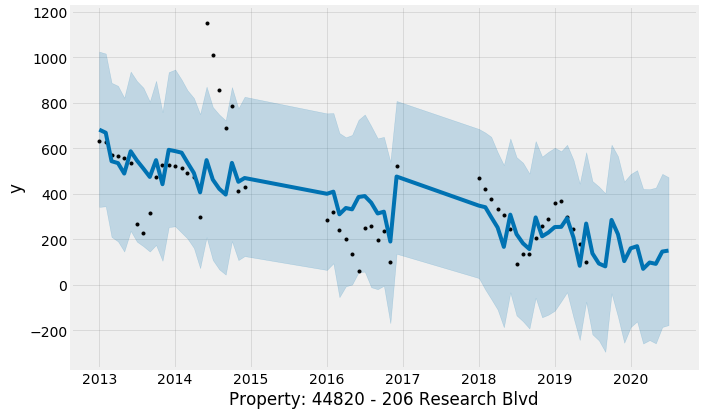

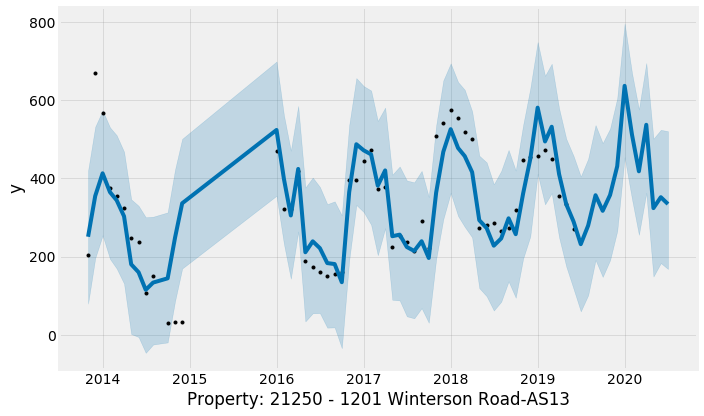

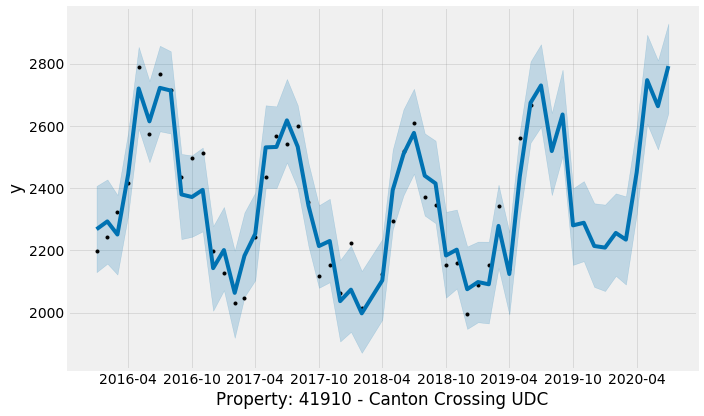

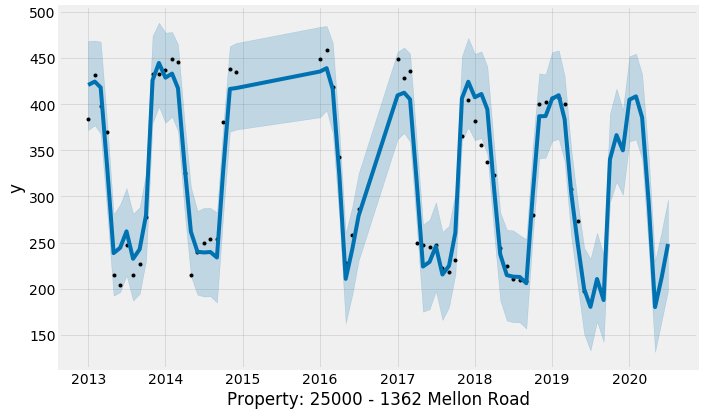

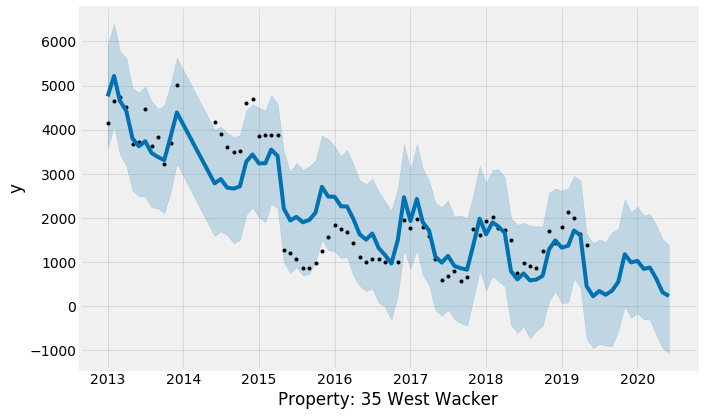

...

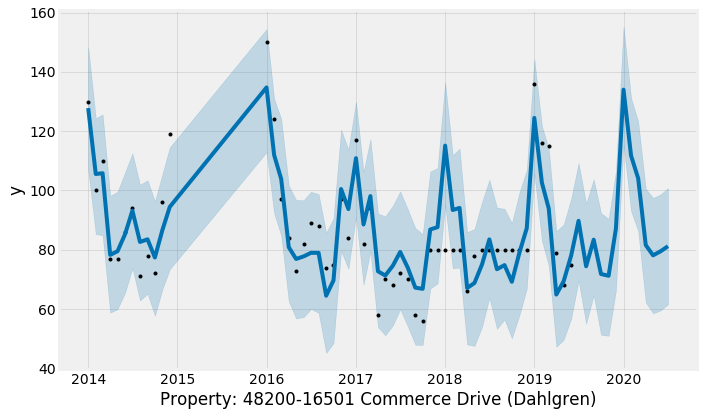

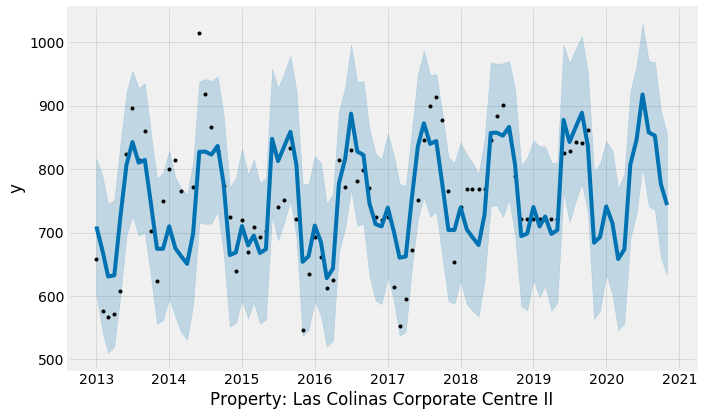

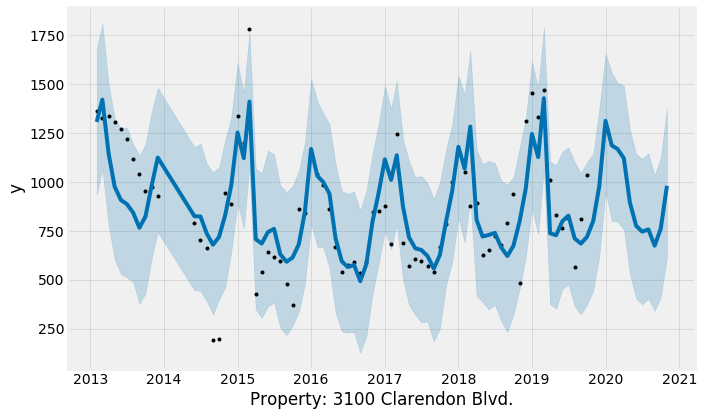

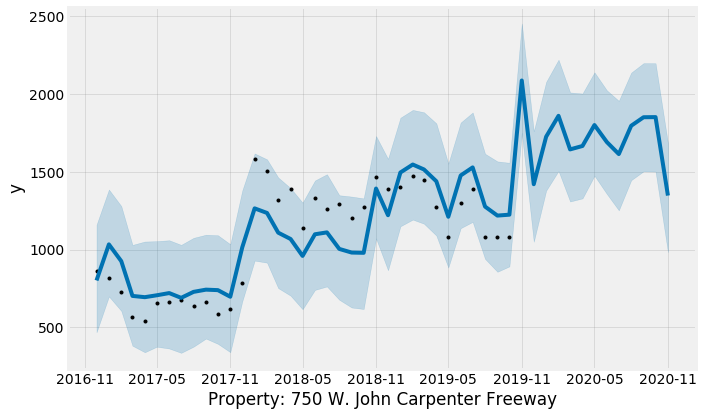

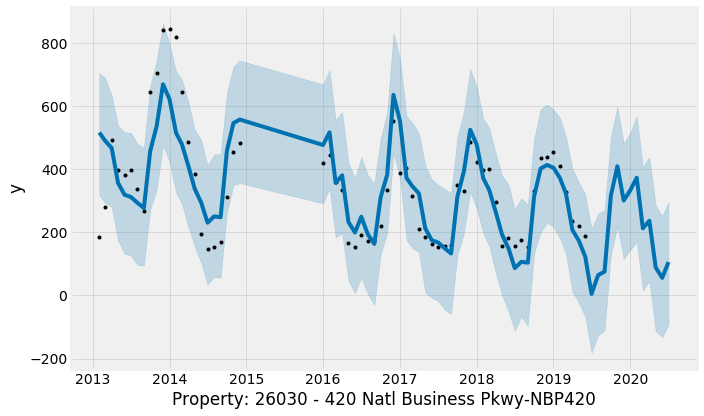

In [37]:
df_demand = pd.DataFrame()
for address in df_dict.keys():
    Demanddf = df_dict[address] 
    Demanddf['Month'] = pd.to_datetime(Demanddf['Month']) 
    Demanddf = Demanddf[['Month', 'Demand']]
    Demanddf = Demanddf.rename(columns={'Month': 'ds' ,'Demand': 'y'})
     
    Demand_model = Prophet(interval_width=0.95)
    
    if Demanddf.shape[0] < 2:
      continue
    Demand_model.fit(Demanddf)
    future_dates = Demand_model.make_future_dataframe(periods=13, freq='MS')
    future_dates.tail()
    forecast = Demand_model.predict(future_dates)
    forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
    Demand_model.plot(forecast, uncertainty=True, xlabel=address)
    forecast["Address"] = address 
    df_demand = df_cost.append(forecast)
    print(df_demand.tail)
    df_demand.to_csv('demandoutput.csv', index=False)

    

In [0]:
from google.colab import files
files.download("demandoutput.csv")